# Practical Machine Learning for Physicists
# Coursework D

In this notebook you will be trying to predict a system using incomplete information. We will set up the equations of motions for a simple double pendulum (or should that be a double simple pendulum. Then we will see if a machine learning technique can predict the future position of the lower mass, using only the lower mass positions.

### Kinematics of the double pendulum
Let's specify our problem in terms of the following, with the origin at the pivot point of the top pendulum. This is just background for the machine learning tasks at the bottom of the notebook.

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$ 


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$ 
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where 
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt 
from scipy.integrate import solve_ivp

import matplotlib as mpl #Some more style nonsense

#Set default figure size
#mpl.rcParams['figure.figsize'] = [12.0, 8.0] #Inches... of course it is inches
mpl.rcParams["legend.frameon"] = False
mpl.rcParams['figure.dpi']=200 # dots per inch

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

#Import tqdm for progress bar
from tqdm import tqdm

In [2]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulem
    """
    theta1, w1, theta2, w2 = z    #The four components
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot   #Return the w's and the wdot's


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2
    

In [3]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]
#z0=[0.1,0,0.1,0]

#Time ranges
tmax, dt = 50,0.1
t = np.arange(0, tmax+dt, dt)

In [4]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


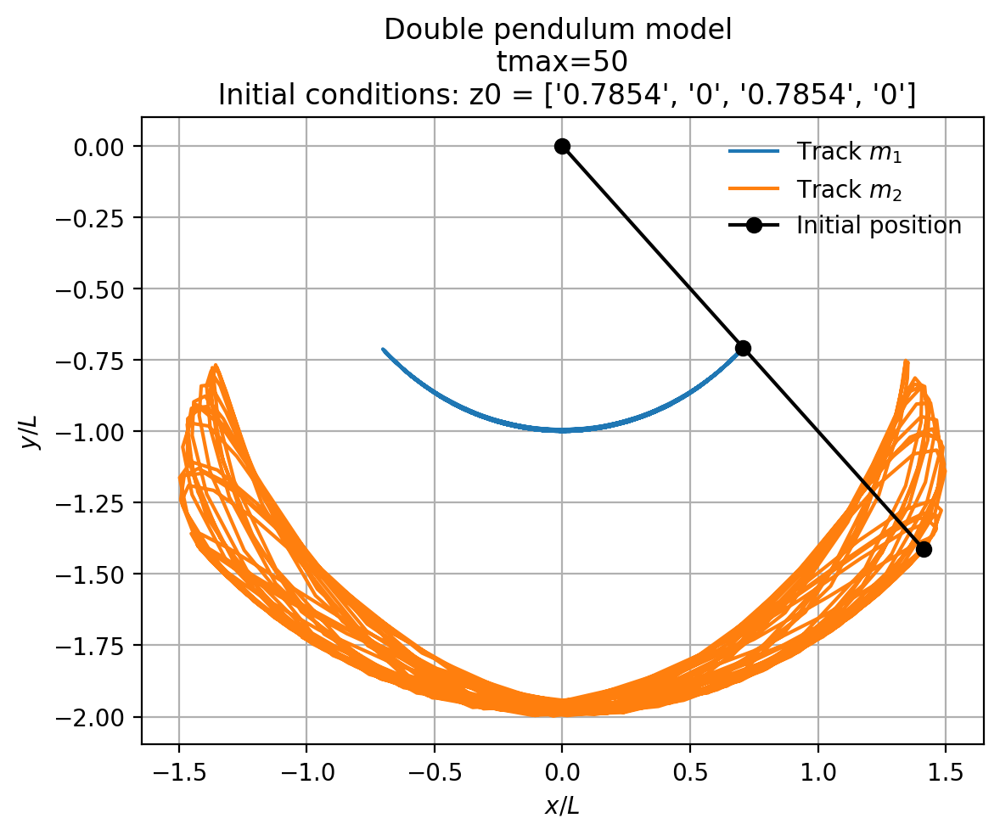

In [5]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
# Neaten
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
plt.title(f"Double pendulum model \n tmax={tmax} \n Initial conditions: z0 = {[f'{i:.4g}' for i in z0]}")
plt.grid()
ax.legend()


# Exercises: Predicting Chaos
1. Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$. 
2. How stable is your network to variations in initial conditions? Make a plot of $x$ and $y$ vs time to show the network prediction in comparison to the solution from solve_ivp
3. How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)
4. Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.
5. Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass $m_2$ (i.e without showing your neural network the positions of the mass $m_1$)



## 1. Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$. 

### 1.0 Function definitions

#### 1.0.1 Creating dataset
The way we will create our dataset is by using the function `shapeArray`. This function returns the the array of input windows and the array of target windows.

`windowsize` will be the length of our array which we extract from the sequence to form an input window.

Then, we will predict `offset` steps ahead. Thus our `shapeArray` function would need to return the array at a length `offset` later. 

`for i in range(len(x)-(windowsize+offset)+1)])`: For all entries in the array `x` the furthest away we will predict is at a length `windowsize+offset` afterwards. We add 1 so that our loop is inclusive of the final value of this array. So this loop ensures that we extract all possible values in this x array without exceeding its dimensions.

In [6]:
def shapeArray(x,windowsize,offset):
    """ Takes in an array and extracts out an input window based on windowSize.
    Also extracts out a label window which will be our target window.
    
    Inputs:
    x - numpy array of input sequence
    windowsize - size of each input window
    offset - amount of steps ahead which will be used for predictions """
    xInput= np.array([x[i : i + windowsize] for i in range(len(x)-(windowsize+offset)+1)])
    xLabel= np.array([x[i +windowsize : i+ windowsize+offset] for i in range(len(x)-(windowsize+offset)+1)])
    return (xInput,xLabel)

#### 1.0.2 Plotting pendulum

In [7]:
def plot_pendulum(tmax,dt,z0):
    """ Plots the two-dimensional trajectory of the double-pendulum system.
    Allows for a visual comparison of the neural network's prediction to the true trajectory.
    
    Inputs:
    tmax - time for which our pendulum is modelled
    dt - time step
    z0 - initial conditions array in angular coordinates
    
    Output:
    Left plot - predicted double pendulum motion by network
    Right plot - true double pendulum motion by network """
    # Create time array
    t = np.arange(0, tmax + dt, dt)

    # Compute our testing z values
    ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
    z_true = ret.y
    t_true = ret.t

    # Also get our true Cartesian coordinates
    theta1, w1, theta2, w2 = z_true[0], z_true[1], z_true[2], z_true[3]
    x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

    # Create our test and target datasets from our true z values
    z_true = np.transpose(z_true) # so that its dimensions are (numberSteps, 4) instead
    z_test, z_target = shapeArray(z_true, windowSize, offset)
    z_target = z_target[:, -1] # this gives our array exactly offset steps ahead

    # Use model to predict the future state of pendulum
    z_pred = model.predict_on_batch(z_test)
    z_pred = np.transpose(z_pred)
    theta1_pred, w1_pred, theta2_pred, w2_pred = z_pred[0], z_pred[1], z_pred[2], z_pred[3]

    # Convert to Cartesian coordinates
    x1_pred, y1_pred, x2_pred, y2_pred, vx1_pred, vy1_pred, vx2_pred, vy2_pred = to_cartesian(theta1_pred, w1_pred, theta2_pred, w2_pred, L1, L2)
    
    # Add the times before the window to our predicted values (this just makes the plot better)
    x1_pred = np.concatenate( (x1[:windowSize+offset-1],x1_pred) )
    y1_pred = np.concatenate( (y1[:windowSize+offset-1],y1_pred) )
    x2_pred = np.concatenate( (x2[:windowSize+offset-1],x2_pred) )
    y2_pred = np.concatenate( (y2[:windowSize+offset-1],y2_pred) )
    vx1_pred = np.concatenate( (vx1[:windowSize+offset-1],vx1_pred) )
    vy1_pred = np.concatenate( (vy1[:windowSize+offset-1],vy1_pred) )
    vx2_pred = np.concatenate( (vx2[:windowSize+offset-1],vx2_pred) )
    vy2_pred = np.concatenate( (vy2[:windowSize+offset-1],vy2_pred) )
    
    # Plot two-dimensional trajectory
    fig,ax=plt.subplots(1,2,figsize=(17,8))
    fig.suptitle(f"Double pendulum model \n tmax={tmax} \n Initial conditions: z0 = {[f'{i:.4g}' for i in z0]}")
    ax[0].plot(x1_pred, y1_pred, label=r"Track $m_1$"), ax[1].plot(x1, y1, label=r"Track $m_1$")
    ax[0].plot(x2_pred, y2_pred, label=r"Track $m_2$"), ax[1].plot(x2, y2, label=r"Track $m_2$")
    ax[0].plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k'), ax[1].plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')

    # Neaten
    ax[0].set_ylabel(r"$y/L$"), ax[1].set_ylabel(r"$y/L$")
    ax[0].set_xlabel(r"$x/L$"), ax[1].set_xlabel(r"$x/L$")
    ax[0].set_title("Predicted trajectory"), ax[1].set_title("True trajectory")
    ax[0].grid(), ax[1].grid()
    ax[0].legend(), ax[1].legend()
    
    plt.show()

#### 1.0.3 Plotting components

In [8]:
def plot_components(tmax,dt,z0):
    """ Plots the individual x and y components of the double-pendulum system.
    Allows for a visual comparison of the neural network's prediction to the true trajectory.
    
    Inputs:
    tmax - time for which our pendulum is modelled
    dt - time step
    z0 - initial conditions array in angular coordinates
    
    Output:
    Left plot - predicted double pendulum motion by network
    Right plot - true double pendulum motion by network """
    # Create time array
    t = np.arange(0, tmax + dt, dt)
    
    # Compute our testing z values
    ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
    z_true = ret.y
    t_true = ret.t
    
    # Also get our true Cartesian coordinates
    theta1, w1, theta2, w2 = z_true[0], z_true[1], z_true[2], z_true[3]
    x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
    # Create our test and target datasets from our true z values
    z_true = np.transpose(z_true) # so that its dimensions are (numberSteps, 4) instead
    z_test, z_target = shapeArray(z_true, windowSize, offset)
    z_target = z_target[:, -1]

    # Use model to predict the future state of pendulum
    z_pred = model.predict_on_batch(z_test)
    z_pred = np.transpose(z_pred)
    theta1_pred, w1_pred, theta2_pred, w2_pred = z_pred[0], z_pred[1], z_pred[2], z_pred[3]

    
    # Convert to Cartesian coordinates
    x1_pred, y1_pred, x2_pred, y2_pred, vx1_pred, vy1_pred, vx2_pred, vy2_pred = to_cartesian(theta1_pred, w1_pred, theta2_pred, w2_pred, L1, L2)

    # Add the times before the window to our predicted values (this just makes the plot better)
    x1_pred = np.concatenate( (x1[:windowSize+offset-1],x1_pred) )
    y1_pred = np.concatenate( (y1[:windowSize+offset-1],y1_pred) )
    x2_pred = np.concatenate( (x2[:windowSize+offset-1],x2_pred) )
    y2_pred = np.concatenate( (y2[:windowSize+offset-1],y2_pred) )
    vx1_pred = np.concatenate( (vx1[:windowSize+offset-1],vx1_pred) )
    vy1_pred = np.concatenate( (vy1[:windowSize+offset-1],vy1_pred) )
    vx2_pred = np.concatenate( (vx2[:windowSize+offset-1],vx2_pred) )
    vy2_pred = np.concatenate( (vy2[:windowSize+offset-1],vy2_pred) )
    
    # Plot two-dimensional trajectory
    fig,ax=plt.subplots(1,2,figsize=(17,8))
    fig.suptitle(f"Trajectory of $m_2$ \n tmax={tmax} \n Initial conditions: z0 = {[f'{i:.4g}' for i in z0]}")
    ax[0].plot(t_true, x2, label=r"Actual track"), ax[1].plot(t_true, y2, label="Actual track") 
    ax[0].plot(t_true, x2_pred, label="Predicted track"), ax[1].plot(t_true, y2_pred, label="Predicted track")

    # Neaten
    ax[0].set_ylabel(r"$t$"), ax[1].set_ylabel(r"$x/L$")
    ax[0].set_xlabel(r"$t$"), ax[1].set_xlabel(r"$y/L$")
    ax[0].set_title("Horizontal trajectories"), ax[1].set_title("Vertical trajectories")
    ax[0].grid(), ax[1].grid()
    ax[0].legend(), ax[1].legend()
    
    plt.show()

### 1.1 Creating network
So below I've opted to use a LSTM model with 100 neurons. LSTM stands for "long short term memory" and can easily learn long-term dependencies. The backbone of a LSTM are its three gates; the input gate, the forget gate, and the output gate.

In [9]:
# LSTM model
model=keras.models.Sequential()
model.add(keras.layers.Input(shape=(None,4)))
model.add(keras.layers.LSTM(100,return_sequences=False)) # LSTM layer with 100 neurons
model.add(keras.layers.Dense(4,activation="linear"))
model.compile(loss='mean_squared_error',optimizer='adam')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               42000     
                                                                 
 dense (Dense)               (None, 4)                 404       
                                                                 
Total params: 42404 (165.64 KB)
Trainable params: 42404 (165.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


### 1.2 Training network

In [10]:
# Create our t array
tmax = 50
dt = 0.1
t = np.arange(0, tmax + dt, dt)

# Now calculate our z array
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z = ret.y
z = np.transpose(z)

windowSize = 20
offset = 20

zInput, zTarget = shapeArray(z,windowSize,offset)
zTarget = zTarget[:, -1]

steps=100  #Number of training steps
costs=np.zeros(steps)  #Array for plotting cost
for i in tqdm(range(steps)):
    costs[i] =model.train_on_batch(zInput,zTarget) #Train the network

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 30.40it/s]


### 1.3 Plotting pendulum

#### 1.3.1 Plotting pendulum for trained time region

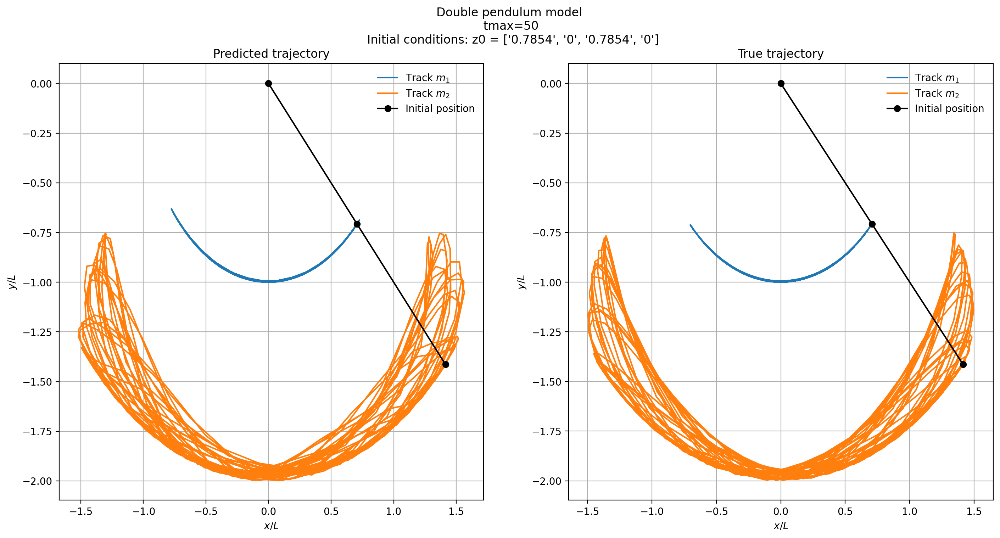

In [11]:
tmax = 50
dt = 0.1

plot_pendulum(tmax,dt,z0)

#### 1.3.2 Plotting pendulum for extrapolated time region

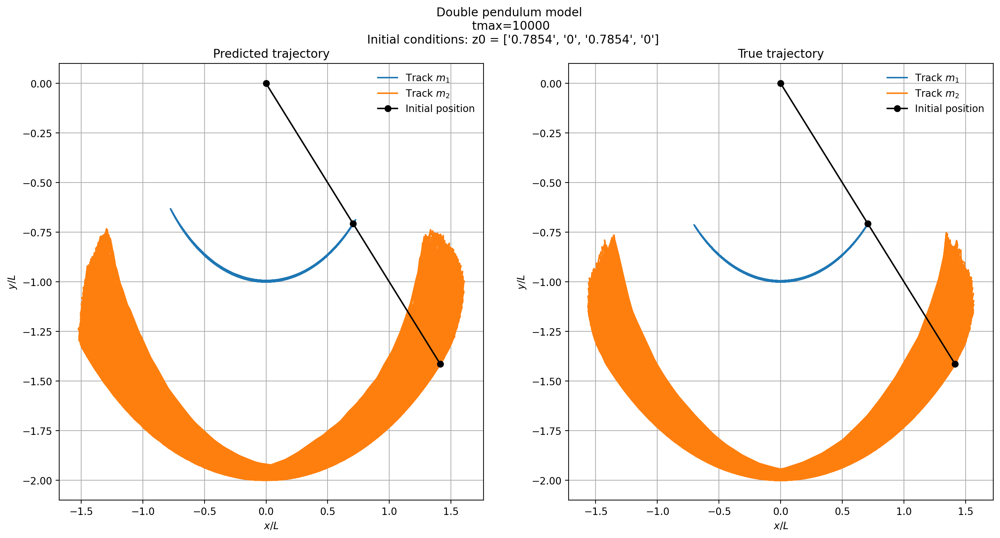

In [12]:
tmax = 10000
dt = 0.1

plot_pendulum(tmax,dt,z0)

## 2. How stable is your network to variations in initial conditions? Make a plot of $x$ and $y$ vs time to show the network prediction in comparison to the solution from solve_ivp

### 2.1 Plotting components of initial conditions $z0$ $=$ [$\pi/4$,$0$,$\pi/4$,$0$]

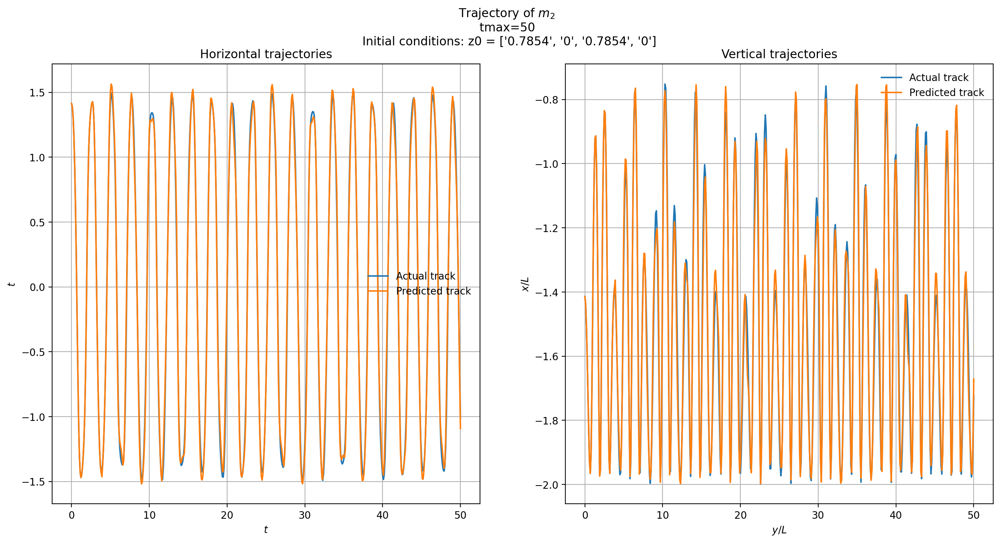

In [13]:
tmax = 50
dt = 0.1

plot_components(tmax,dt,z0)

### 2.2 Perturbing initial angles

#### 2.2.1 Perturbation of 0.05 radians

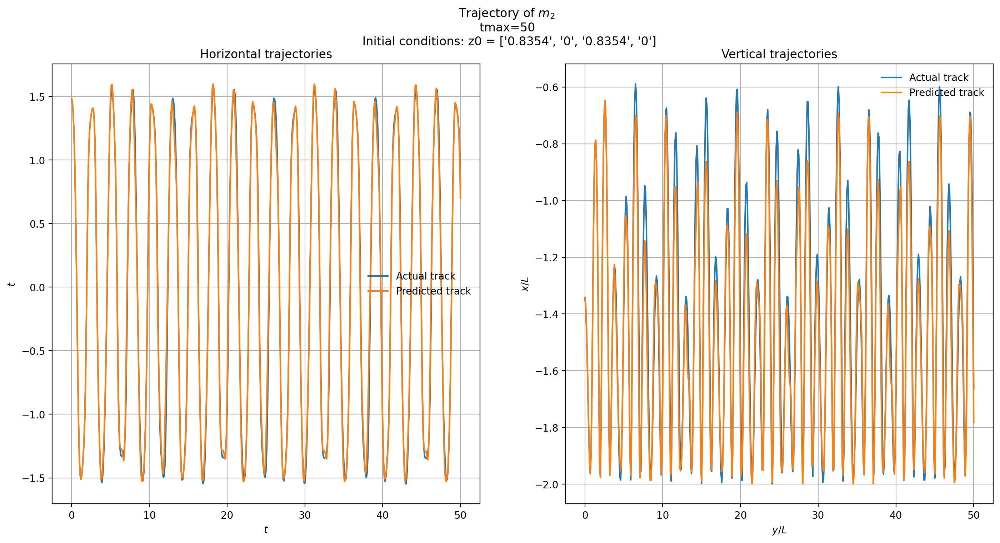

In [14]:
tmax = 50
dt = 0.1
z = z0 + 0.05*np.array([1,0,1,0])

plot_components(tmax,dt,z)

#### 2.2.2 Perturbation of 0.15 radians

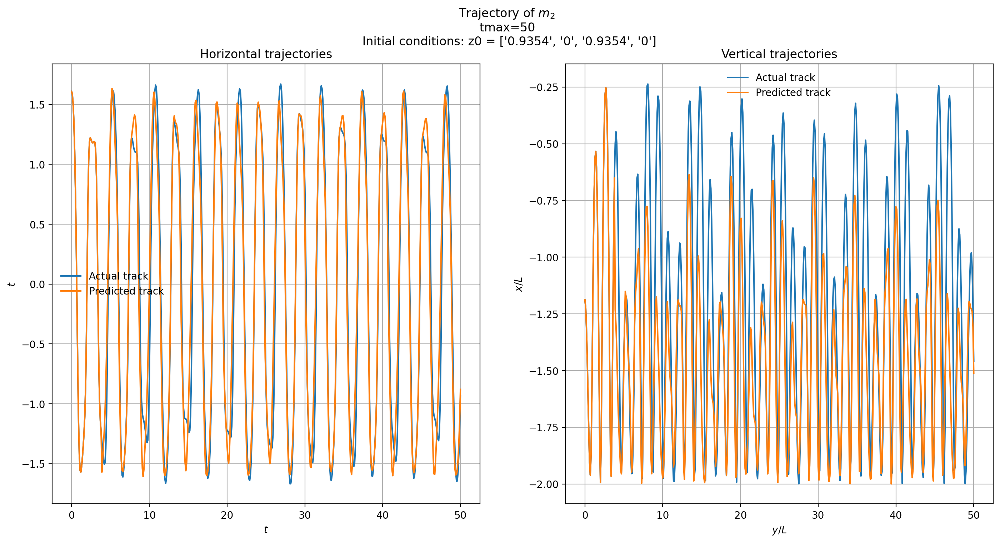

In [15]:
tmax = 50
dt = 0.1
z = z0 + 0.15*np.array([1,0,1,0])

plot_components(tmax,dt,z)

### 2.3 Perturbing initial velocities

#### 2.3.1 Perturbation of 0.1 rad/s

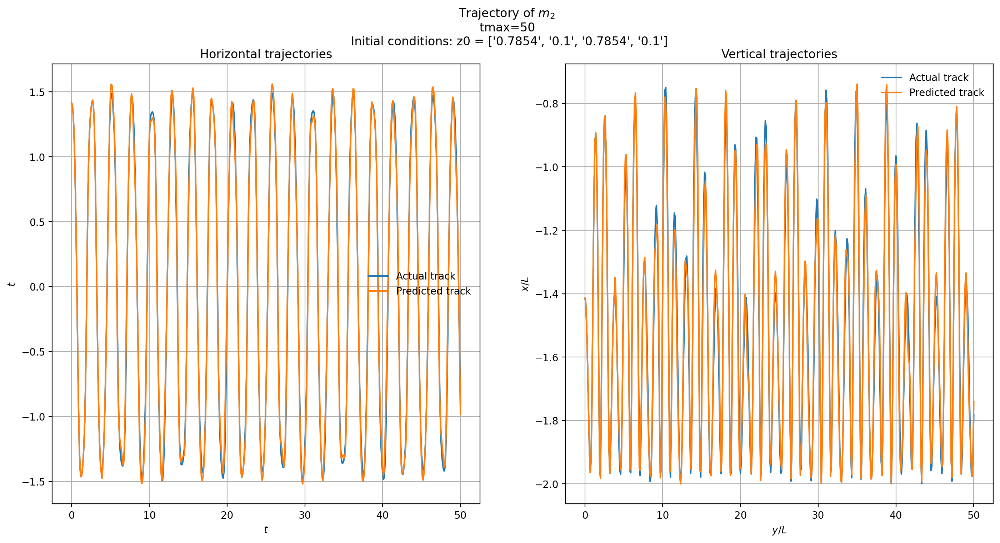

In [16]:
tmax = 50
dt = 0.1
z = z0 + 0.1*np.array([0,1,0,1])

plot_components(tmax,dt,z)

#### 2.3.2 Perturbation of 0.5 rad/s

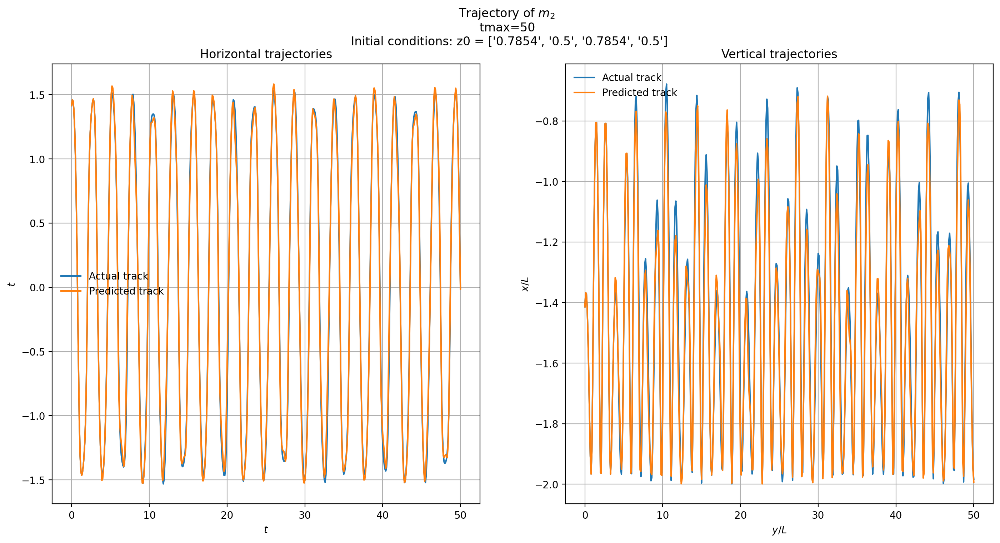

In [17]:
tmax = 50
dt = 0.1
z = z0 + 0.5*np.array([0,1,0,1])

plot_components(tmax,dt,z)

## 3. How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)

### 3.1 Defining offset variation function

In [18]:
def extrapolation_errors(step,tmax,dt,z0):
    """Investigates how the deviation between the true and predicted positions of the pendulum change with increased offset.
    Trains a new neural network each time.
    Inputs:
    step - the difference between offset values from 20 to 100
    tmax - maximum time our network is trained over
    dt - time step
    z0 - initial conditions in angular coordinates
    
    Outputs:
    Left plot - errors of m2 with increasing offset
    Right plot - errors of m1 with increasing offset"""
    offset = np.arange(20,101,step)

    error_1 = np.zeros( len(offset) )
    error_2 = np.zeros(len(offset) )
    for j in range(len(offset)):
        # Create a new model
        model=keras.models.Sequential()
        model.add(keras.layers.Input(shape=(None,4)))
        model.add(keras.layers.LSTM(100,return_sequences=False)) # LSTM layer with 100 neurons
        model.add(keras.layers.Dense(4,activation="linear"))
        model.compile(loss='mean_squared_error',optimizer='adam')

        t = np.arange(0, tmax+dt, dt)

        ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
        z = ret.y
        z = np.transpose(z)

        windowSize = 20
        zInput, zTarget = shapeArray(z,windowSize,offset[j])
        zTarget = zTarget[:, -1]        

        steps=100
        for n in tqdm(range(steps)):
            model.train_on_batch(zInput,zTarget)

        # Extrapolate time to untrained region
        tmax_new = 2*tmax
        # Create time array
        t = np.arange(0, 2*tmax + dt, dt)

        # Compute our testing z values
        ret = solve_ivp(rhs, (0, 2*tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
        z_true = ret.y
        t_true = ret.t

        # Also get our true Cartesian coordinates
        theta1, w1, theta2, w2 = z_true[0], z_true[1], z_true[2], z_true[3]
        x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

        # Create our test and target datasets from our true z values
        z_true = np.transpose(z_true) # so that its dimensions are (numberSteps, 4) instead
        z_test, z_target = shapeArray(z_true, windowSize, offset[j])
        z_target = z_target[:, -1]

        # Use model to predict the future state of pendulum
        z_pred = model.predict_on_batch(z_test)
        z_pred = np.transpose(z_pred)
        theta1_pred, w1_pred, theta2_pred, w2_pred = z_pred[0], z_pred[1], z_pred[2], z_pred[3]

        # Convert to Cartesian coordinates
        x1_pred, y1_pred, x2_pred, y2_pred, vx1_pred, vy1_pred, vx2_pred, vy2_pred = to_cartesian(theta1_pred, w1_pred, theta2_pred, w2_pred, L1, L2)

        # Find position magnitudes
        pred_1 = np.sqrt( x1_pred**2 + y1_pred**2 )
        true_1 = np.sqrt( x1**2 + y1**2 )
        pred_2 = np.sqrt( x2_pred**2 + y2_pred**2 )
        true_2 = np.sqrt( x2**2 + y2**2 )

        # Find errors
        error_1[j] = np.sqrt(np.mean((true_1[windowSize+offset[j]-1:] - pred_1)**2))
        error_2[j] = np.sqrt(np.mean((true_2[windowSize+offset[j]-1:] - pred_2)**2))
        
    # Create array of extrapolation times
    t = np.arange(20,101,step)
    fig,ax=plt.subplots(1,2,figsize=(12,5))
    fig.suptitle("Errors between predicted positions and actual positions")
    # Plot graphs
    ax[0].plot(t,error_2), ax[1].plot(t,error_1)
    ax[0].set_xlabel("Extrapolation time $t$"), ax[1].set_xlabel("Extrapolation time $t$")
    ax[0].set_ylabel("Deviation"), ax[1].set_ylabel("Deviation")
    ax[0].set_title("Mass $m_2$"), ax[1].set_title("Mass $m_1$")
    ax[0].grid(),ax[1].grid()
    
    plt.show()

### 3.2 Plotting errors

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:19<00:00,  5.05it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:20<00:00,  4.79it/s]


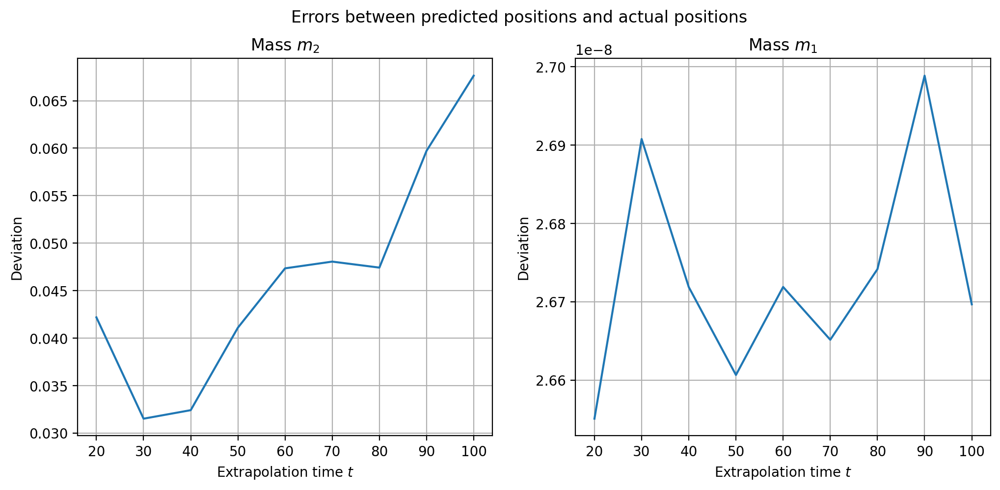

In [19]:
z0 = np.array( [np.pi/4, 0, np.pi/4, 0])
step = 10
tmax = 300
dt = 0.1
extrapolation_errors(step,tmax,dt,z0)

some comment about errors

## 4. Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.

### 4.1 Recreating neural network

In [20]:
# LSTM model
model=keras.models.Sequential()
model.add(keras.layers.Input(shape=(None,4)))
model.add(keras.layers.LSTM(100,return_sequences=False)) # LSTM layer with 50 neurons
model.add(keras.layers.Dense(4,activation="linear"))
model.compile(loss='mean_squared_error',optimizer='adam')
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 100)               42000     
                                                                 
 dense_10 (Dense)            (None, 4)                 404       
                                                                 
Total params: 42404 (165.64 KB)
Trainable params: 42404 (165.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


### 4.2 Training network

In [21]:
# Create our t array
tmax = 50
dt = 0.1
t = np.arange(0, tmax + dt, dt)
z0=[np.pi/2,0,np.pi/2,0]

# Now calculate our z array
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z = ret.y
z = np.transpose(z)

windowSize = 20
offset = 20

zInput, zTarget = shapeArray(z,windowSize,offset)
zTarget = zTarget[:, -1]

steps=100  #Number of training steps
costs=np.zeros(steps)  #Array for plotting cost
for i in tqdm(range(steps)):
    costs[i] =model.train_on_batch(zInput,zTarget) #Train the network

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 16.41it/s]


### 4.3 Plotting pendulum

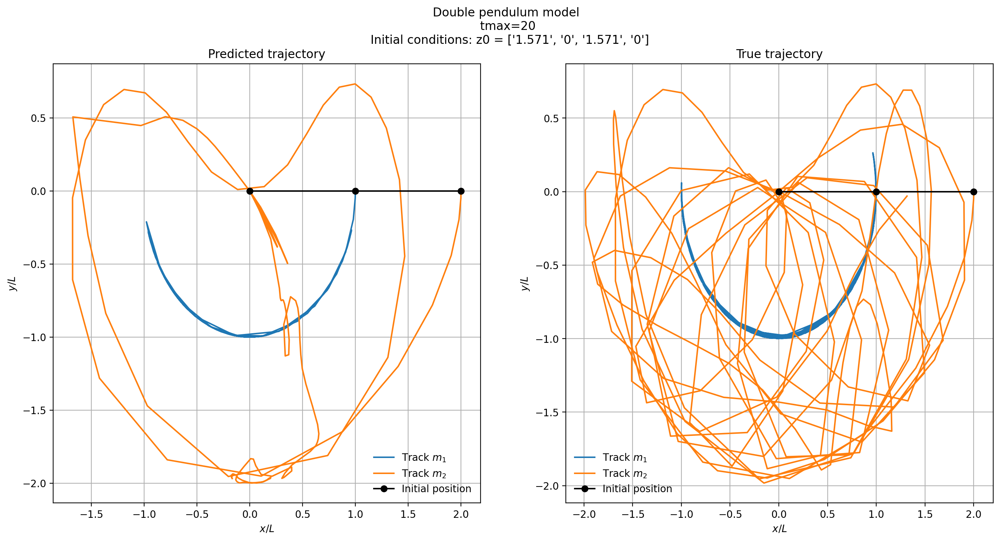

In [22]:
tmax = 20
dt = 0.1

plot_pendulum(tmax,dt,z0)

### 4.4 Perturbing initial velocities

#### 4.4.1 Plotting components of initial conditions $z0$ $=$ [$\pi/4$,$0$,$\pi/4$,$0$]

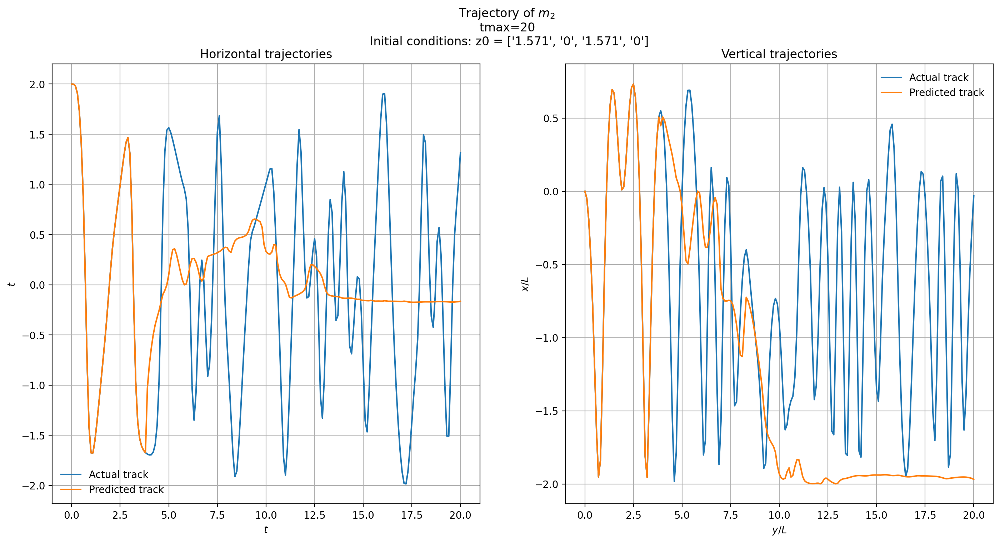

In [23]:
tmax = 20
dt = 0.1

plot_components(tmax,dt,z0)

### 4.6 How far into the future can our network predict?

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:19<00:00,  5.10it/s]


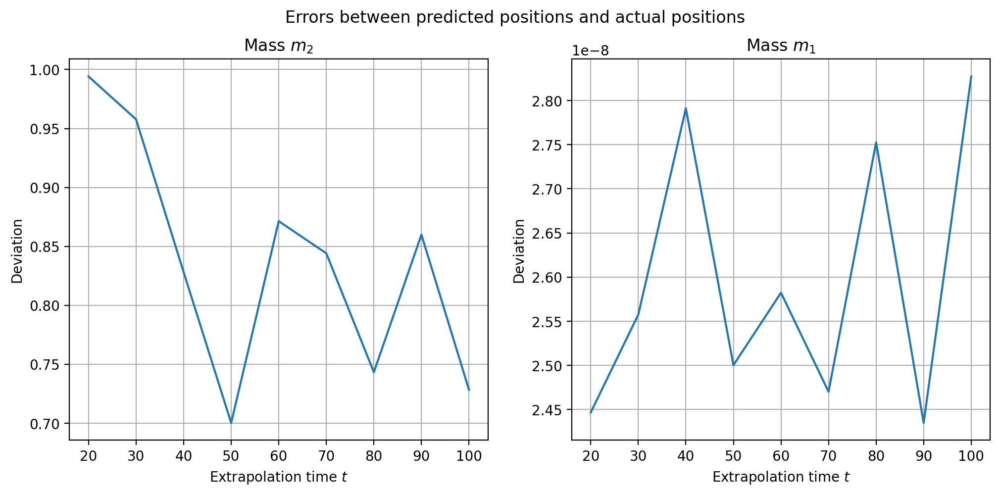

In [24]:
z0 = np.array( [np.pi/2, 0, np.pi/2, 0])
step = 10
tmax = 300
dt = 0.1
extrapolation_errors(step,tmax,dt,z0)

## 5. Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass $m_2$ (i.e without showing your neural network the positions of the mass $m_1$)


### 5.1 Defining functions

In [25]:
def shapeArray(x,y,windowsize,offset):
    """ Takes in an array x and extracts out an input window based on windowSize.
    Also extracts out a label window from our target array y which will be our target window.
    
    Inputs:
    x - numpy array of input sequence
    y - numpy array of output sequence
    windowsize - size of each input window
    offset - amount of steps ahead which will be used for predictions """
    xInput= np.array([x[i : i + windowsize] for i in range(len(x)-(windowsize+offset)+1)])
    xLabel= np.array([y[i +windowsize : i+ windowsize+offset] for i in range(len(y)-(windowsize+offset)+1)])
    return (xInput,xLabel)

In [26]:
def plot_pendulum_m2_only(tmax, dt, z0):
    """ Plots the two-dimensional trajectory of the double-pendulum system, without m1 fed into the network.
    Allows for a visual comparison of the neural network's prediction to the true trajectory.
    
    Inputs:
    tmax - time for which our pendulum is modelled
    dt - time step
    z0 - initial conditions array in angular coordinates
    
    Output:
    Left plot - predicted double pendulum motion by network
    Right plot - true double pendulum motion by network """
    # Create time array
    t = np.arange(0, tmax + dt, dt)

    # Compute our testing z values
    ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
    z_true = ret.y
    t_true = ret.t

    # Also get our true Cartesian coordinates
    theta1, w1, theta2, w2 = z_true[0], z_true[1], z_true[2], z_true[3]
    x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

    # Create our test and target datasets from our true z values
    z_true_m2 = np.array([z_true[2],z_true[3]]) # We will only feed in the details of m2
    z_true_m2 = np.transpose(z_true_m2)
    z_true = np.transpose(z_true)
    z_test, z_target = shapeArray(z_true_m2, z_true, windowSize, offset)
    z_target = z_target[:, -1]
    
    # Use model to predict the future state of pendulum
    z_pred = model.predict_on_batch(z_test)
    z_pred = np.transpose(z_pred)
    theta1_pred, w1_pred, theta2_pred, w2_pred = z_pred[0], z_pred[1], z_pred[2], z_pred[3]

    # Convert to Cartesian coordinates
    x1_pred, y1_pred, x2_pred, y2_pred, vx1_pred, vy1_pred, vx2_pred, vy2_pred = to_cartesian(theta1_pred, w1_pred, theta2_pred, w2_pred, L1, L2)

    # Add the times before the window to our predicted values (this just makes the plot better)
    x1_pred = np.concatenate( (x1[:windowSize+offset-1],x1_pred) )
    y1_pred = np.concatenate( (y1[:windowSize+offset-1],y1_pred) )
    x2_pred = np.concatenate( (x2[:windowSize+offset-1],x2_pred) )
    y2_pred = np.concatenate( (y2[:windowSize+offset-1],y2_pred) )
    vx1_pred = np.concatenate( (vx1[:windowSize+offset-1],vx1_pred) )
    vy1_pred = np.concatenate( (vy1[:windowSize+offset-1],vy1_pred) )
    vx2_pred = np.concatenate( (vx2[:windowSize+offset-1],vx2_pred) )
    vy2_pred = np.concatenate( (vy2[:windowSize+offset-1],vy2_pred) )

    # Plot two-dimensional trajectory
    fig,ax=plt.subplots(1,2,figsize=(17,8))
    fig.suptitle(f"Double pendulum model \n tmax={tmax} \n Initial conditions: z0 = {[f'{i:.4g}' for i in z0]}")
    ax[0].plot(x1_pred, y1_pred, label=r"Track $m_1$"), ax[1].plot(x1, y1, label=r"Track $m_1$")
    ax[0].plot(x2_pred, y2_pred, label=r"Track $m_2$"), ax[1].plot(x2, y2, label=r"Track $m_2$")
    ax[0].plot([0, x2[0]], [0, y2[0]], "-o", label="Initial position", c='k'), ax[1].plot([0, x2[0]], [0, y2[0]], "-o", label="Initial position", c='k')

    # Neaten
    ax[0].set_ylabel(r"$y/L$"), ax[1].set_ylabel(r"$y/L$")
    ax[0].set_xlabel(r"$x/L$"), ax[1].set_xlabel(r"$x/L$")
    ax[0].set_title("Predicted trajectory"), ax[1].set_title("True trajectory")
    ax[0].grid(), ax[1].grid()
    ax[0].legend(), ax[1].legend()

    plt.show()

In [27]:
def plot_components_m2_only(tmax,dt,z0):
    """ Plots the individual x and y components of the double-pendulum system, without feeding in m1 to the network.
    Allows for a visual comparison of the neural network's prediction to the true trajectory.
    
    Inputs:
    tmax - time for which our pendulum is modelled
    dt - time step
    z0 - initial conditions array in angular coordinates
    
    Output:
    Left plot - predicted double pendulum motion by network
    Right plot - true double pendulum motion by network """
    # Create time array
    t = np.arange(0, tmax + dt, dt)

    # Compute our testing z values
    ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
    z_true = ret.y
    t_true = ret.t

    # Also get our true Cartesian coordinates
    theta1, w1, theta2, w2 = z_true[0], z_true[1], z_true[2], z_true[3]
    x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

    # Create our test and target datasets from our true z values
    z_true_m2 = np.array([z_true[2],z_true[3]]) # We will only feed in the details of m2
    z_true_m2 = np.transpose(z_true_m2)
    z_true = np.transpose(z_true)
    z_test, z_target = shapeArray(z_true_m2, z_true, windowSize, offset)
    z_target = z_target[:, -1]
    
    # Use model to predict the future state of pendulum
    z_pred = model.predict_on_batch(z_test)
    z_pred = np.transpose(z_pred)
    theta1_pred, w1_pred, theta2_pred, w2_pred = z_pred[0], z_pred[1], z_pred[2], z_pred[3]

    # Convert to Cartesian coordinates
    x1_pred, y1_pred, x2_pred, y2_pred, vx1_pred, vy1_pred, vx2_pred, vy2_pred = to_cartesian(theta1_pred, w1_pred, theta2_pred, w2_pred, L1, L2)

    # Add the times before the window to our predicted values (this just makes the plot better)
    x1_pred = np.concatenate( (x1[:windowSize+offset-1],x1_pred) )
    y1_pred = np.concatenate( (y1[:windowSize+offset-1],y1_pred) )
    x2_pred = np.concatenate( (x2[:windowSize+offset-1],x2_pred) )
    y2_pred = np.concatenate( (y2[:windowSize+offset-1],y2_pred) )
    vx1_pred = np.concatenate( (vx1[:windowSize+offset-1],vx1_pred) )
    vy1_pred = np.concatenate( (vy1[:windowSize+offset-1],vy1_pred) )
    vx2_pred = np.concatenate( (vx2[:windowSize+offset-1],vx2_pred) )
    vy2_pred = np.concatenate( (vy2[:windowSize+offset-1],vy2_pred) )

    # Plot two-dimensional trajectory
    fig,ax=plt.subplots(1,2,figsize=(17,8))
    fig.suptitle(f"Trajectory of $m_2$ \n tmax={tmax} \n Initial conditions: z0 = {[f'{i:.4g}' for i in z0]}")
    ax[0].plot(t_true, x2, label=r"Actual track"), ax[1].plot(t_true, y2, label="Actual track") 
    ax[0].plot(t_true, x2_pred, label="Predicted track"), ax[1].plot(t_true, y2_pred, label="Predicted track")

    # Neaten
    ax[0].set_ylabel(r"$t$"), ax[1].set_ylabel(r"$x/L$")
    ax[0].set_xlabel(r"$t$"), ax[1].set_xlabel(r"$y/L$")
    ax[0].set_title("Horizontal trajectories"), ax[1].set_title("Vertical trajectories")
    ax[0].grid(), ax[1].grid()
    ax[0].legend(), ax[1].legend()

    plt.show()    

###  Creating neural network

In [28]:
# LSTM model
model=keras.models.Sequential()
model.add(keras.layers.Input(shape=(None,2)))
model.add(keras.layers.LSTM(100,return_sequences=False)) # LSTM layer with 50 neurons
model.add(keras.layers.Dense(4,activation="linear"))
model.compile(loss='mean_squared_error',optimizer='adam')
model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_20 (LSTM)              (None, 100)               41200     
                                                                 
 dense_20 (Dense)            (None, 4)                 404       
                                                                 
Total params: 41604 (162.52 KB)
Trainable params: 41604 (162.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [29]:
# Create our t array
tmax = 50
dt = 0.1
t = np.arange(0, tmax + dt, dt)
z0 = np.array([np.pi/4,0,np.pi/4,0])

# Now calculate our z array
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z = ret.y
z_m2 = np.array([z[2],z[3]])
z_m2 = np.transpose(z_m2)
z = np.transpose(z)

windowSize = 20
offset = 20

zInput, zTarget = shapeArray(z_m2,z,windowSize,offset)
zTarget = zTarget[:, -1]

steps=100  #Number of training steps
costs=np.zeros(steps)  #Array for plotting cost
for i in tqdm(range(steps)):
    costs[i] =model.train_on_batch(zInput,zTarget) #Train the network

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.08it/s]


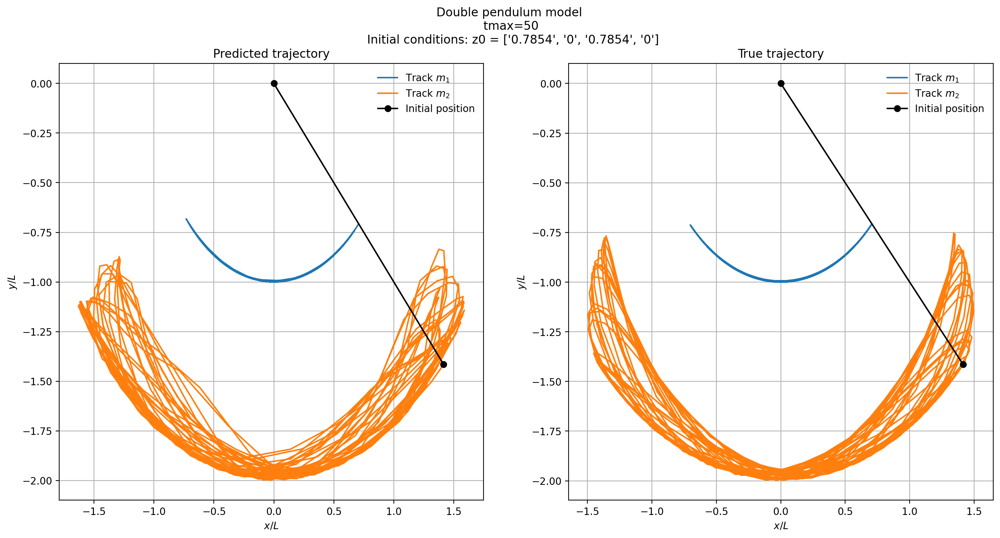

In [30]:
tmax=50
dt=0.1

plot_pendulum_m2_only(tmax,dt,z0)

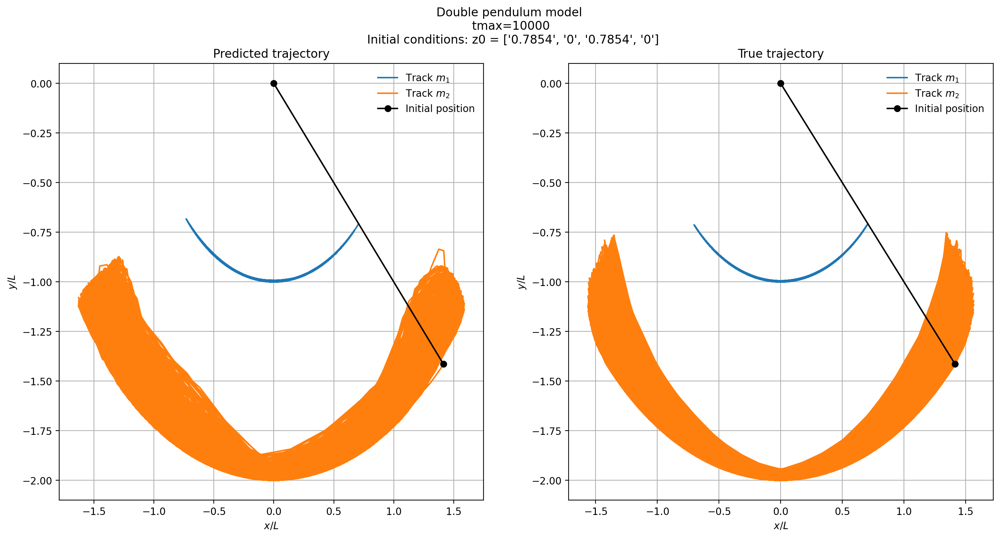

In [31]:
tmax = 10000
dt = 0.1

plot_pendulum_m2_only(tmax,dt,z0)

Seems to retrace the original plot very well. But at the edges we can see slight differences

do we want to talk about some interesting results?

Somethings I want to say, I'm not really bothered to do them in a smaller coursework like this. For a given timeframe one could loop over values of delta (perturbation). Then we could find the difference between the actual values found from ivp_solve and the predicted values from the neural network, as some sort of 'error'. etc

## Investigating slight variations to initial conditions

### Same initial conditions as before

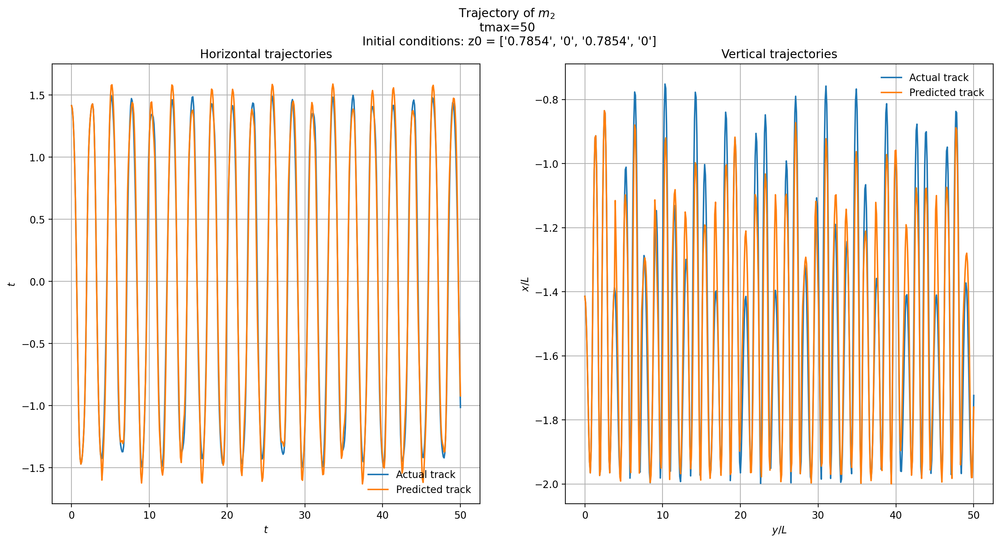

In [32]:
tmax = 50
dt = 0.1

plot_components_m2_only(tmax,dt,z0)

If one chooses a smaller time frame, like 50, we will see that the horizontal trajectories have near perfect agreement, whereas the vertical trajectories disagree a bit more. But the vertical trajectories at least for this small time frame still show generally good agreement.

The further we extend our time the more they begin to deviate from eachother. That's a hallmark of chaotic systems. The further we propagate our system for, the more inaccurate it becomes. Also when we model physical systems our error will usually increase with time. More extrapolation leads to more inaccuracies.

### Perturbing initial angles

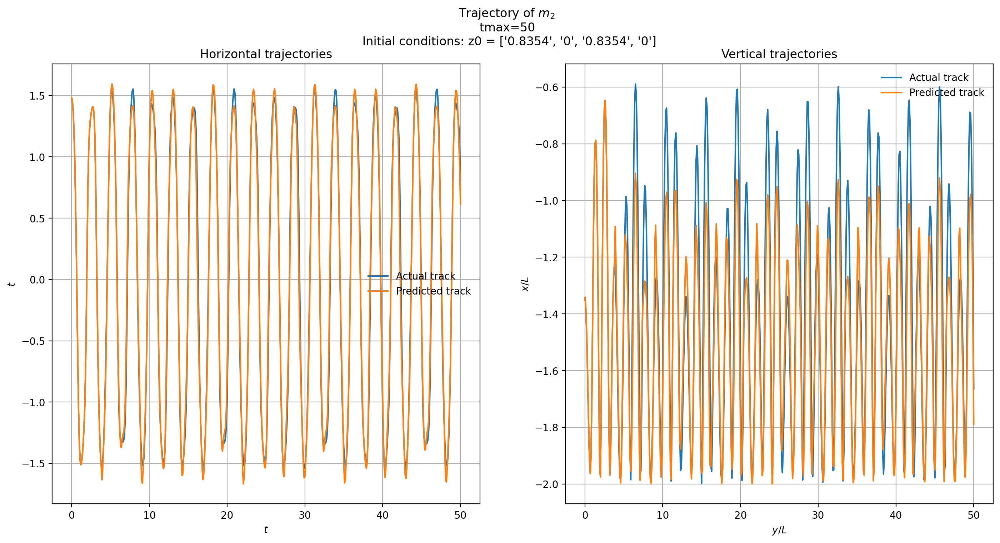

In [33]:
tmax = 50
dt = 0.1
z = z0 + 0.05*np.array([1,0,1,0])

plot_components_m2_only(tmax,dt,z)

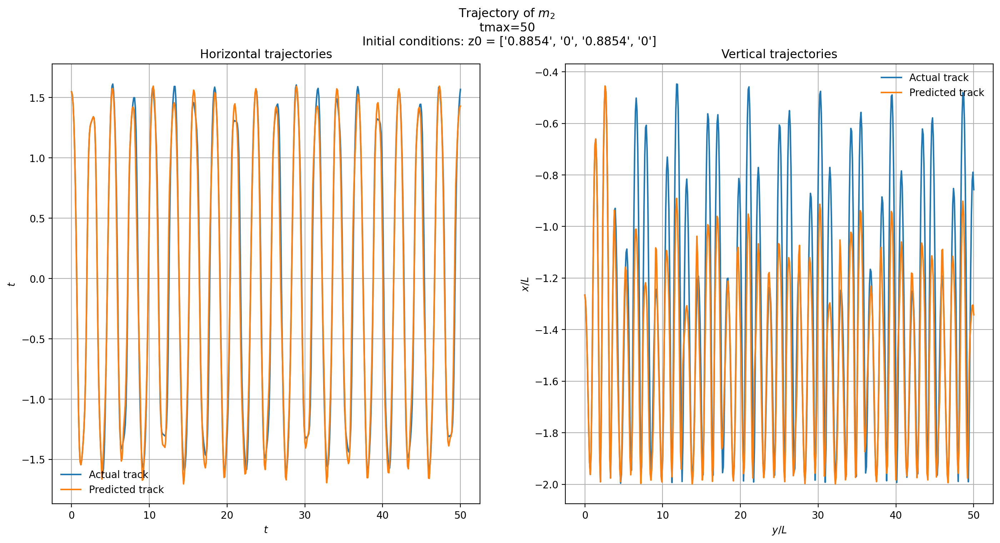

In [34]:
tmax = 50
dt = 0.1
z = z0 + 0.10*np.array([1,0,1,0])

plot_components_m2_only(tmax,dt,z)

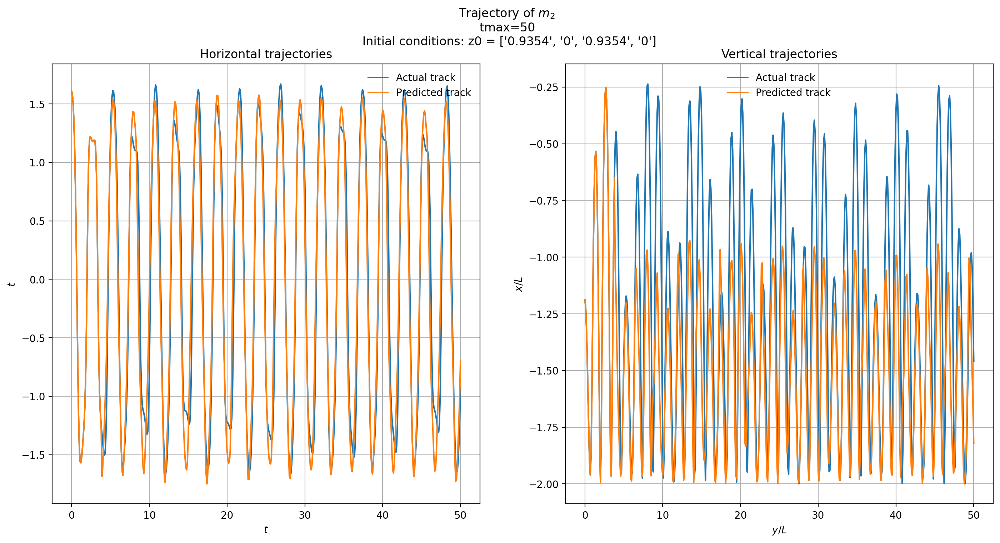

In [35]:
tmax = 50
dt = 0.1
z = z0 + 0.15*np.array([1,0,1,0])

plot_components_m2_only(tmax,dt,z)

We can see that the neural network does a fairly good job of predicting how the double pendulum propagates over time up until about t=1000 seconds. This is where the neural network gets really bad at predictions. The actual system begins to deviate far more. That's because at this time the system falls into chaos. 

### Investigating changing initial velocities

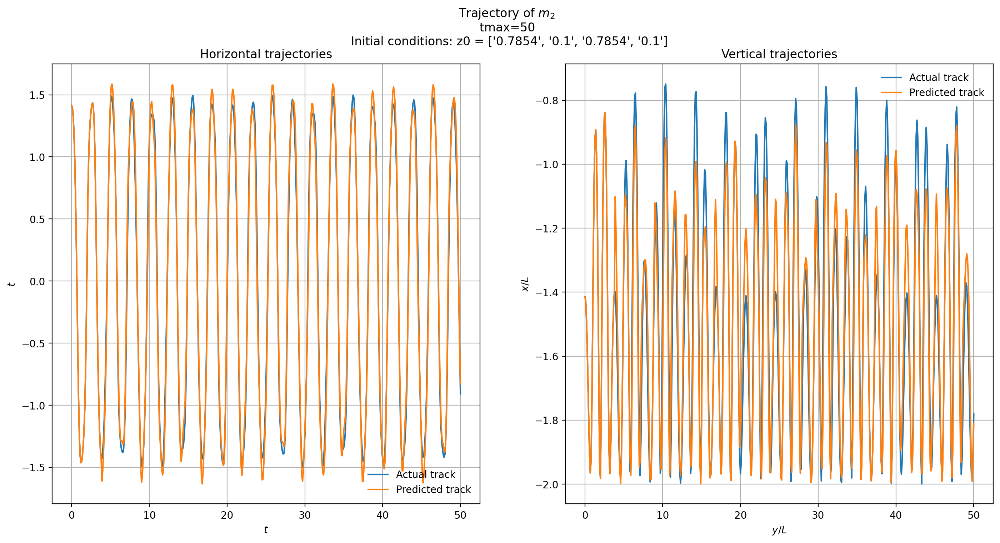

In [36]:
tmax = 50
dt = 0.1
z = z0 + 0.1*np.array([0,1,0,1])

plot_components_m2_only(tmax,dt,z)

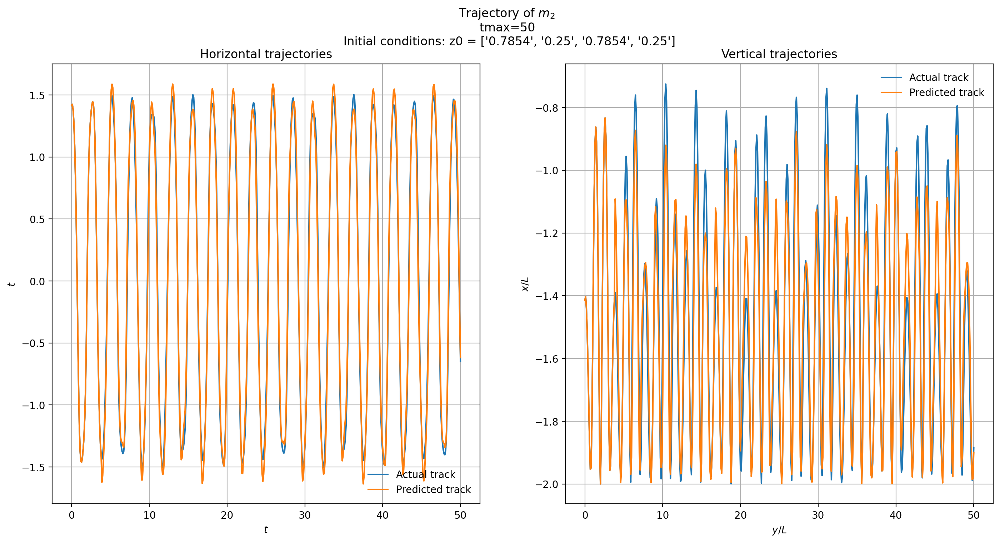

In [37]:
tmax = 50
dt = 0.1
z = z0 + 0.25*np.array([0,1,0,1])

plot_components_m2_only(tmax,dt,z)

### How far into the future can a network predict?
How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from  𝑡=𝑡0+20𝛿𝑡
  to  𝑡=𝑡0+100𝛿𝑡
  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)

In [38]:
def extrapolation_errors_m2_only(step,tmax,dt,z0):
    """Investigates how the deviation between the true and predicted positions of the pendulum change with increased offset.
    Trains a new neural network each time.
    Does not use the values of m1 in the neural network, but the network will still try to predict them.
    Inputs:
    step - the difference between offset values from 20 to 100
    tmax - maximum time our network is trained over
    dt - time step
    z0 - initial conditions in angular coordinates
    
    Outputs:
    Left plot - errors of m2 with increasing offset
    Right plot - errors of m1 with increasing offset"""
    offset = np.arange(20,101,step)
    windowSize = 20

    error_1 = np.zeros( len(offset) )
    error_2 = np.zeros(len(offset) )
    
    for j in range(len(offset)):
        # Create a new model
        model=keras.models.Sequential()
        model.add(keras.layers.Input(shape=(None,2)))
        model.add(keras.layers.LSTM(100,return_sequences=False)) # LSTM layer with 100 neurons
        model.add(keras.layers.Dense(4,activation="linear"))
        model.compile(loss='mean_squared_error',optimizer='adam')
        
        # Create our t array
        t = np.arange(0, tmax+dt, dt)
        
        # Now calculate our z array
        ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
        z = ret.y
        z_m2 = np.array([z[2],z[3]])
        z_m2 = np.transpose(z_m2)
        z = np.transpose(z)

        zInput, zTarget = shapeArray(z_m2,z,windowSize,offset[j])
        zTarget = zTarget[:, -1]

        steps=100
        for n in tqdm(range(steps)):
            model.train_on_batch(zInput,zTarget)

        # Extrapolate time to untrained region
        tmax_new = 2*tmax
        # Create time array
        t = np.arange(0, 2*tmax + dt, dt)

        # Compute our testing z values
        ret = solve_ivp(rhs, (0, 2*tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
        z_true = ret.y
        t_true = ret.t

        # Also get our true Cartesian coordinates
        theta1, w1, theta2, w2 = z_true[0], z_true[1], z_true[2], z_true[3]
        x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

        # Create our test and target datasets from our true z values
        z_true_m2 = np.array([z_true[2],z_true[3]]) # We will only feed in the details of m2
        z_true_m2 = np.transpose(z_true_m2)
        z_true = np.transpose(z_true)
        z_test, z_target = shapeArray(z_true_m2, z_true, windowSize, offset[j])
        z_target = z_target[:, -1]


        # Use model to predict the future state of pendulum
        z_pred = model.predict_on_batch(z_test)
        z_pred = np.transpose(z_pred)
        theta1_pred, w1_pred, theta2_pred, w2_pred = z_pred[0], z_pred[1], z_pred[2], z_pred[3]

        # Convert to Cartesian coordinates
        x1_pred, y1_pred, x2_pred, y2_pred, vx1_pred, vy1_pred, vx2_pred, vy2_pred = to_cartesian(theta1_pred, w1_pred, theta2_pred, w2_pred, L1, L2)

        # Find position magnitudes
        pred_1 = np.sqrt( x1_pred**2 + y1_pred**2 )
        true_1 = np.sqrt( x1**2 + y1**2 )
        pred_2 = np.sqrt( x2_pred**2 + y2_pred**2 )
        true_2 = np.sqrt( x2**2 + y2**2 )

        # Find errors
        error_1[j] = np.sqrt(np.mean((true_1[windowSize+offset[j]-1:] - pred_1)**2))
        error_2[j] = np.sqrt(np.mean((true_2[windowSize+offset[j]-1:] - pred_2)**2))
        
    # Create array of extrapolation times
    t = np.arange(20,101,step)
    fig,ax=plt.subplots(1,2,figsize=(12,5))
    fig.suptitle("Errors between predicted positions and actual positions")
    # Plot graphs
    ax[0].plot(t,error_2), ax[1].plot(t,error_1)
    ax[0].set_xlabel("Extrapolation time $t$"), ax[1].set_xlabel("Extrapolation time $t$")
    ax[0].set_ylabel("Deviation"), ax[1].set_ylabel("Deviation")
    ax[0].set_title("Mass $m_2$"), ax[1].set_title("Mass $m_1$")
    ax[0].grid(),ax[1].grid()
    
    plt.show()

### Plotting errors

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:21<00:00,  4.72it/s]


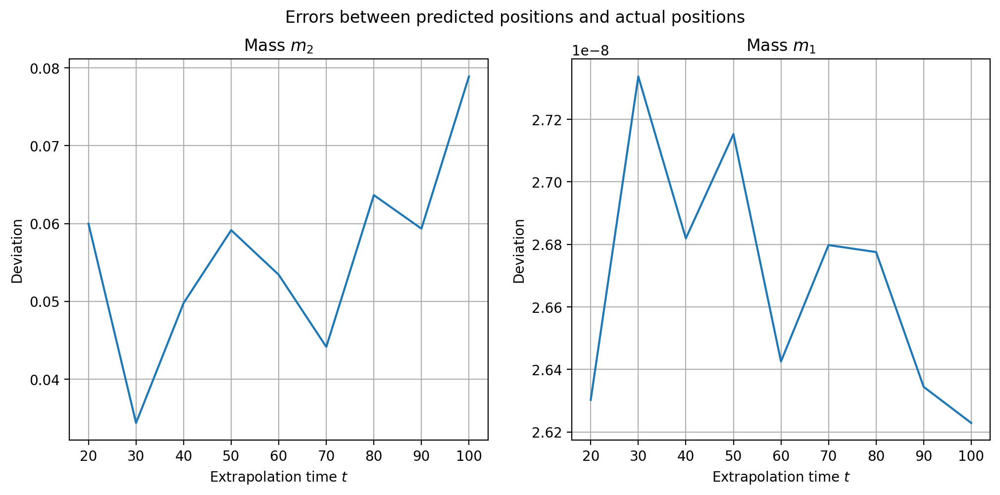

In [39]:
z0 = np.array( [np.pi/4, 0, np.pi/4, 0])
step = 10
tmax = 300
dt = 0.1
extrapolation_errors_m2_only(step,tmax,dt,z0)

some comment about errors

## Looking at a different initial condition: [$\pi/2$, $0$, $\pi/2$, $0$]

### Recreating neural network

In [40]:
# LSTM model
model=keras.models.Sequential()
model.add(keras.layers.Input(shape=(None,2)))
model.add(keras.layers.LSTM(100,return_sequences=False)) # LSTM layer with 50 neurons
model.add(keras.layers.Dense(4,activation="linear"))
model.compile(loss='mean_squared_error',optimizer='adam')
model.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_30 (LSTM)              (None, 100)               41200     
                                                                 
 dense_30 (Dense)            (None, 4)                 404       
                                                                 
Total params: 41604 (162.52 KB)
Trainable params: 41604 (162.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


### Training network

In [41]:
# Create our t array
tmax = 50
dt = 0.1
t = np.arange(0, tmax + dt, dt)
z0 = np.array([np.pi/2,0,np.pi/2,0])

# Now calculate our z array
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z = ret.y
z_m2 = np.array([z[2],z[3]])
z_m2 = np.transpose(z_m2)
z = np.transpose(z)

windowSize = 20
offset = 20

zInput, zTarget = shapeArray(z_m2,z,windowSize,offset)
zTarget = zTarget[:, -1]

steps=100  #Number of training steps
costs=np.zeros(steps)  #Array for plotting cost
for i in tqdm(range(steps)):
    costs[i] =model.train_on_batch(zInput,zTarget) #Train the network

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 14.59it/s]


### Plotting pendulum

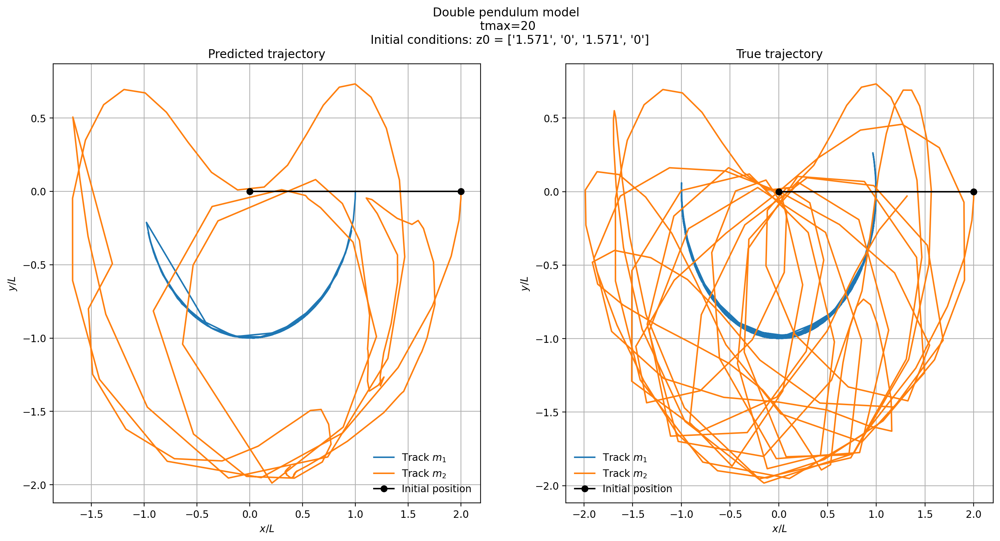

In [42]:
tmax = 20
dt = 0.1

plot_pendulum_m2_only(tmax,dt,z0)

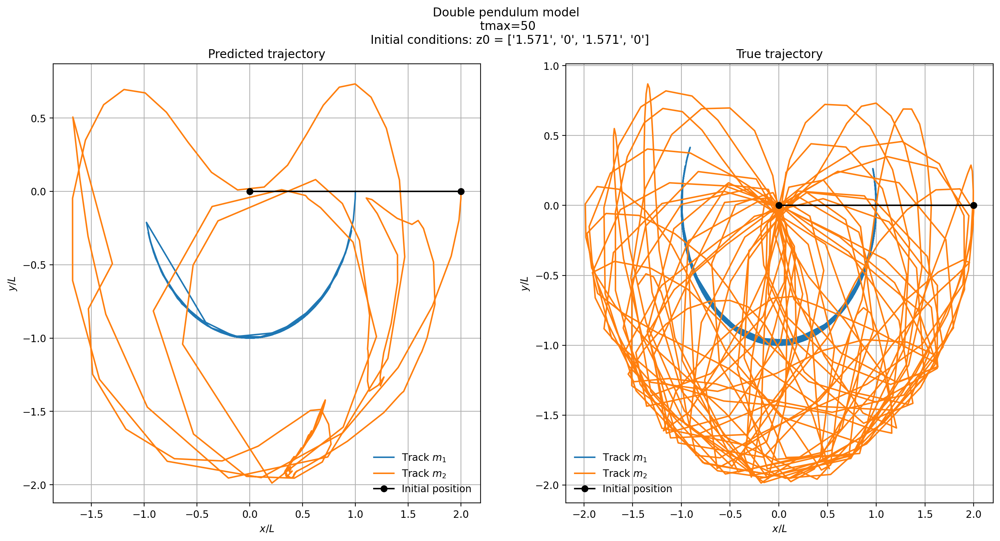

In [43]:
tmax = 50
dt = 0.1

plot_pendulum_m2_only(tmax,dt,z0)

### Firstly plotting initial conditions same

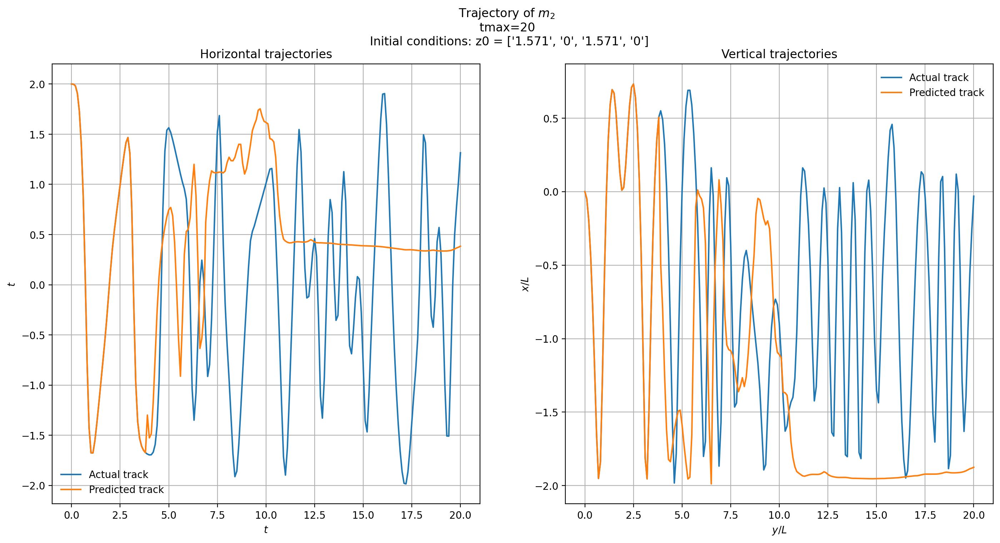

In [44]:
tmax = 20
dt = 0.1

plot_components_m2_only(tmax,dt,z0)

### Perturbing initial angles

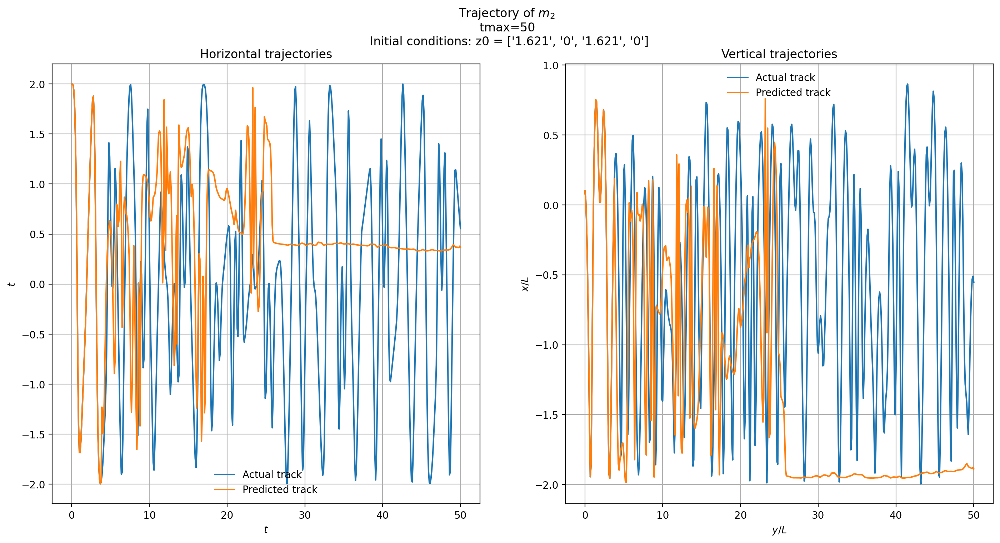

In [45]:
tmax = 50
dt = 0.1
z = z0 + 0.05*np.array([1,0,1,0])

plot_components_m2_only(tmax,dt,z)

### Plotting errors

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:22<00:00,  4.49it/s]


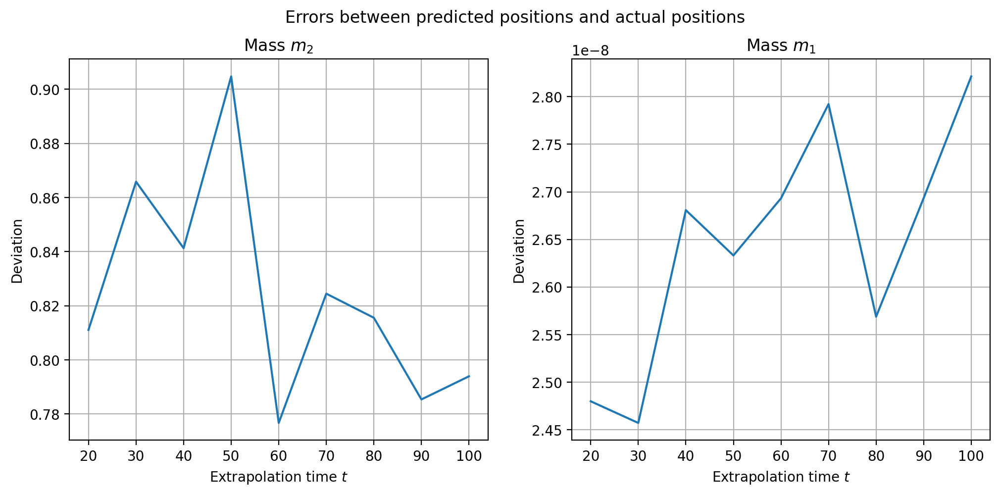

In [46]:
z0 = np.array( [np.pi/2, 0, np.pi/2, 0])
step = 10
tmax = 300
dt = 0.1
extrapolation_errors_m2_only(step,tmax,dt,z0)